In [25]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import geopandas as gpd
import statsmodels.formula.api as smf
from plotnine import *
pd.options.mode.chained_assignment = None
energy = pd.read_csv("https://data.cityofnewyork.us/api/views/usc3-8zwd/rows.csv?accessType=DOWNLOAD")
covered_buildings = pd.read_csv("../data/covered_buildings.csv")

energy['BBL'] = energy['NYC Borough, Block and Lot (BBL)'].str.replace('-', '')
energy = energy[energy['BBL'].isin(covered_buildings['10 Digit BBL'].astype(str))]

/var/folders/ct/9lwc0fbn26v_v6pz1pfj1dxc0000gq/T/ipykernel_88433/2042930284.py:10: DtypeWarning: Columns (9,15,218,219) have mixed types. Specify dtype option on import or set low_memory=False.


In [ ]:
ghg = ghg.dropna(subset = ["co2_intensity", 'kwh'])
ghg = ghg.query("co2_intensity != 0")

In [26]:
housing = energy[energy['Primary Property Type - Portfolio Manager-Calculated'] == "Multifamily Housing"]
housing['total_units'] = pd.to_numeric(housing['Multifamily Housing - Total Number of Residential Living Units'], errors='coerce')
housing['co2_intensity'] = pd.to_numeric(housing['Total GHG Emissions Intensity (kgCO2e/ft²)'], errors='coerce')
housing['EUI'] = pd.to_numeric(housing['Site EUI (kBtu/ft²)'], errors='coerce')
housing['housing_fa'] = pd.to_numeric(housing['Multifamily Housing - Gross Floor Area (ft²)'], errors='coerce')
housing['total_fa'] = pd.to_numeric(housing['Property GFA - Self-Reported (ft²)'], errors='coerce')
housing["total_co2"] = pd.to_numeric(housing['Total GHG Emissions (Metric Tons CO2e)'], errors='coerce') 
housing["bedrooms"] = pd.to_numeric(housing["Multifamily Housing - Number of Bedrooms"], errors='coerce')

In [27]:
housing = housing[housing["bedrooms"] != 0]

In [28]:
housing_trim = housing[['Property Name', 'Property Id', 'total_units', 'EUI', 'bedrooms', 'housing_fa', 'total_fa', 'co2_intensity', "total_co2", 'NTA', 'Latitude', 'Longitude', "Year Built", "Occupancy"]].rename(columns={'Property Name': 'name', 
                                                                                                                                                 'Census Tract' : "GEOID", "Year Built": "year_built"}).query("total_units > 0")

housing_trim['total_E'] = housing_trim['EUI'] * housing_trim['total_fa']
housing_trim['avg_apt_size'] = housing_trim['housing_fa'] / housing_trim['total_units']
housing_trim['E_per_apt'] = housing_trim['total_E'] / housing_trim['total_units']
housing_trim['co2_tons_sq'] = housing_trim['co2_intensity'] / 1000
housing_trim['co2_per_apt'] = (housing_trim['co2_tons_sq'] * housing_trim['total_fa']) / housing_trim['total_units']
housing_trim['co2_per_bedroom'] = (housing_trim['co2_tons_sq'] * housing_trim['total_fa']) / housing_trim['bedrooms']
housing_trim['exceeds_2024_limit'] = housing_trim['co2_tons_sq'] > 0.00675
housing_trim['exceeds_2030_limit'] = housing_trim['co2_tons_sq'] > 0.00407
housing_trim['decade_built'] = (np.floor(housing_trim["year_built"]/10)*10).astype(int)
housing_trim['bedrooms_per_apt'] =  housing_trim["bedrooms"] / housing_trim["total_units"]
housing_trim['sqft_per_bedroom'] = housing_trim['housing_fa'] / housing_trim["bedrooms"]

In [29]:
# 1 row has missing value.. 11 have inf
housing_trim = housing_trim.dropna(subset=["sqft_per_bedroom"])

In [30]:
housing_trim = housing_trim[(housing_trim["housing_fa"] / housing_trim["total_fa"]) == 1]

In [31]:
conditions = [
    (housing_trim['exceeds_2024_limit'] == True),
    (housing_trim['exceeds_2024_limit'] == False) & (housing_trim['exceeds_2030_limit'] == True),
    (housing_trim['exceeds_2024_limit'] == False) & (housing_trim['exceeds_2030_limit'] == False)
]

# Define the choices
choices = ['Exceeds 2024 limit', 'Exceeds 2030 limit', 'Below both limits']

# Create the new column
housing_trim['limit_category'] = np.select(conditions, choices)

In [32]:
housing_trim['apt_size_cat'] = pd.cut(
    housing_trim['avg_apt_size'],
    [0, 750, 1000, 1250, 2000, np.inf],
    labels=["< 750", "750 - 1000", "1000 - 1250", "1250 - 2000", "2000 +"]
)

housing_trim['sqft_bedroom_cat'] = pd.cut(
    housing_trim['sqft_per_bedroom'],
    [0, 450, 600, 750, 1000, np.inf],
    labels=["< 450", "450 - 600", "600 - 750", "750 - 1000", "1000 +"]
)

In [33]:
pd.qcut(housing_trim["sqft_per_bedroom"], 5)

1151                (729.453, 880.758]
1158              (880.758, 59609.346]
1162              (880.758, 59609.346]
1163              (880.758, 59609.346]
1164                (543.826, 661.857]
                     ...              
28057               (729.453, 880.758]
28058               (729.453, 880.758]
28060    (7.1419999999999995, 543.826]
28061               (661.857, 729.453]
28065    (7.1419999999999995, 543.826]
Name: sqft_per_bedroom, Length: 14370, dtype: category
Categories (5, interval[float64, right]): [(7.1419999999999995, 543.826] < (543.826, 661.857] < (661.857, 729.453] < (729.453, 880.758] < (880.758, 59609.346]]

In [34]:
summary_apt_size = housing_trim.groupby('apt_size_cat').agg(
    pct_in_excess_2024=('exceeds_2024_limit', lambda x: np.mean(x)),
    pct_in_excess_2030=('exceeds_2030_limit', lambda x: np.mean(x)),
    n=('exceeds_2024_limit', 'count'),
    avg_co2_apt=('co2_per_apt', 'mean'),
    avg_co2_sqft=('co2_tons_sq', 'mean'),
    avg_occ = ("Occupancy", "mean")
)

/var/folders/ct/9lwc0fbn26v_v6pz1pfj1dxc0000gq/T/ipykernel_88433/2438937437.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


In [35]:
summary_bedroom = housing_trim.groupby('sqft_bedroom_cat').agg(
    pct_in_excess_2024=('exceeds_2024_limit', lambda x: np.mean(x)),
    pct_in_excess_2030=('exceeds_2030_limit', lambda x: np.mean(x)),
    n=('exceeds_2024_limit', 'count'),
    avg_co2_bedroom=('co2_per_bedroom', 'mean'),
    avg_co2_sqft=('co2_tons_sq', 'mean'),
    avg_occ = ("Occupancy", "mean")
)

/var/folders/ct/9lwc0fbn26v_v6pz1pfj1dxc0000gq/T/ipykernel_88433/3165677408.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


In [36]:
summary_apt_size

,pct_in_excess_2024,pct_in_excess_2030,n,avg_co2_apt,avg_co2_sqft,avg_occ
apt_size_cat,,,,,,
< 750,0.290466,0.838137,1353,3.790289,0.005894,98.532890
750 - 1000,0.193986,0.775422,5753,4.768749,0.005430,98.797149
1000 - 1250,0.113050,0.706501,4184,5.385615,0.004875,99.030832
1250 - 2000,0.053129,0.493471,2221,5.993575,0.004084,98.728050
2000 +,0.038417,0.394645,859,12.412892,0.003838,97.689173


In [37]:
summary_bedroom

,pct_in_excess_2024,pct_in_excess_2030,n,avg_co2_bedroom,avg_co2_sqft,avg_occ
sqft_bedroom_cat,,,,,,
< 450,0.273450,0.797297,1258,2.136673,0.005825,98.374404
450 - 600,0.214779,0.785912,2896,2.964508,0.005568,99.060773
600 - 750,0.153117,0.719992,4957,3.446836,0.005051,98.727053
750 - 1000,0.088530,0.657294,3592,3.989081,0.004690,98.807071
1000 +,0.053989,0.466107,1667,5.802245,0.003995,98.554289


In [38]:
ntas = gpd.read_file("https://data.cityofnewyork.us/api/geospatial/d3qk-pfyz?method=export&format=GeoJSON")

In [39]:
nta_stats = housing_trim.groupby(["NTA"]).agg(
    pct_in_excess_2024=('exceeds_2024_limit', lambda x: np.mean(x)),
    pct_in_excess_2030=('exceeds_2030_limit', lambda x: np.mean(x)),
    n=('exceeds_2024_limit', 'count'),
    avg_co2_apt=('co2_per_apt', 'mean'),
    avg_co2_sqft=('co2_tons_sq', 'mean')
).reset_index()

In [40]:
nta_merged = ntas.merge(nta_stats, left_on = "ntaname", right_on = "NTA").query("n > 20")

In [41]:
import folium

base_map = folium.Map(location=[40.730610, -73.935242], zoom_start=10)

folium.Choropleth(
    geo_data=nta_merged,
    data=nta_merged,
    columns=["ntaname", "pct_in_excess_2024"],
    key_on="feature.properties.ntaname",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=1,
    legend_name="pct_in_excess_2024",
    reset=True,
).add_to(base_map)

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}

highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
NIL = folium.features.GeoJson(
    nta_merged,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['ntaname','pct_in_excess_2024'],
        aliases=['Neighborhood','Proportion exceeding 2024 limits: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)


base_map.add_child(NIL)
base_map.keep_in_front(NIL)
folium.LayerControl().add_to(base_map)
base_map

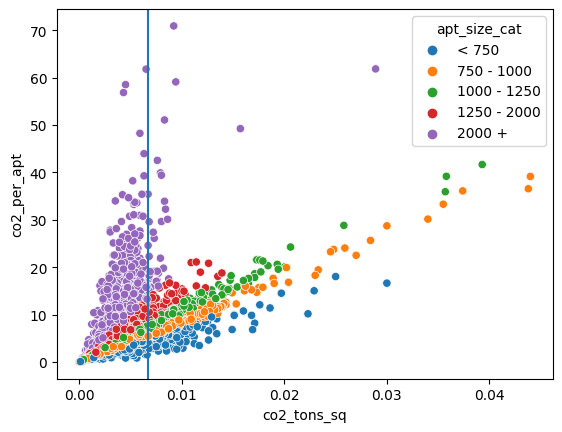

In [18]:
mod_dat = housing_trim[housing_trim['EUI'] < 1000].dropna()

correlation = np.corrcoef(mod_dat['co2_tons_sq'], mod_dat['co2_per_apt'])[0, 1]

plt.figure()
plot = sns.scatterplot(data=mod_dat, x='co2_tons_sq', y='co2_per_apt', hue='apt_size_cat')
plot.axvline(x=0.0067) 

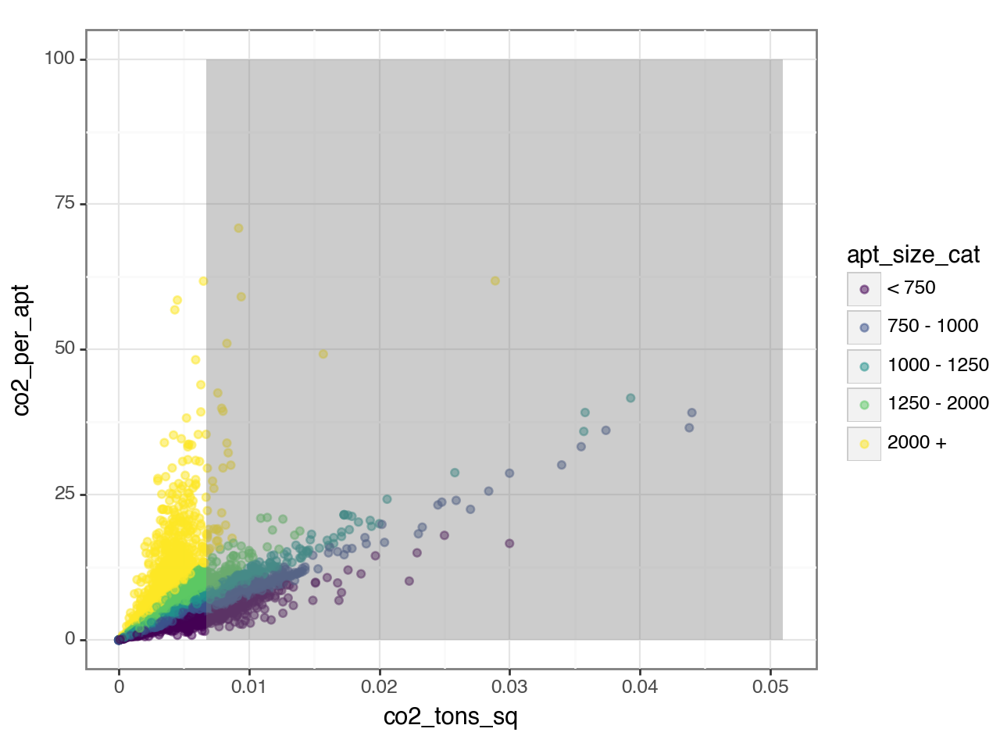

<Figure Size: (640 x 480)>

In [19]:
(ggplot(mod_dat, aes(x = "co2_tons_sq", y = "co2_per_apt", color = "apt_size_cat")) + 
geom_point(alpha = .5) +
annotate('rect', xmin=.0067, xmax=0.051, ymin=0, ymax=100, alpha=.4, fill='grey') + 
theme_bw())

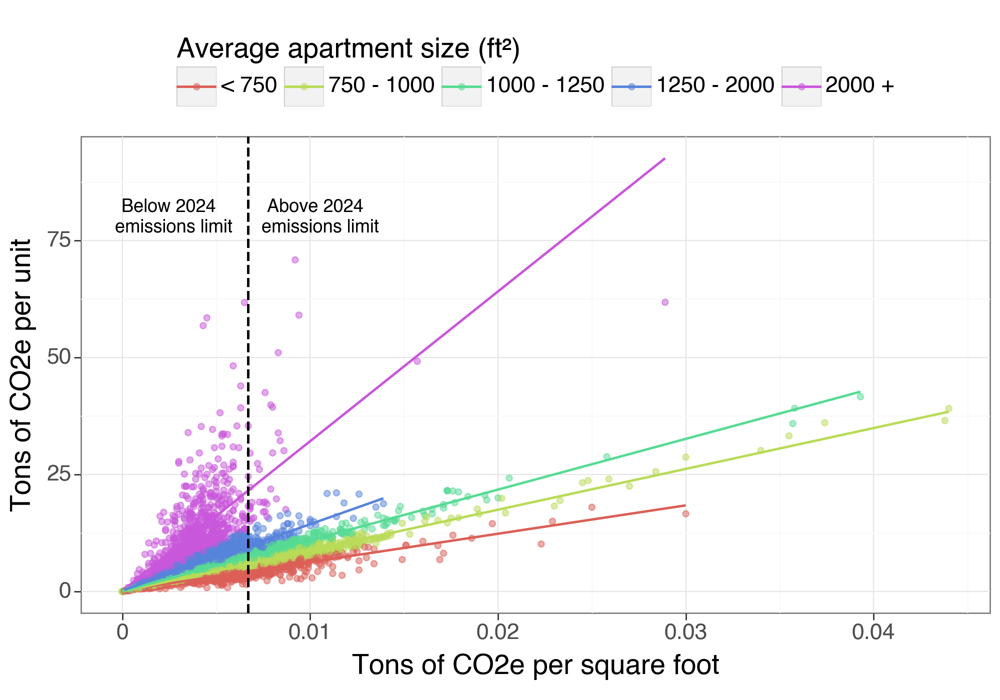

<Figure Size: (1000 x 700)>

In [20]:
(ggplot(mod_dat, aes(x = "co2_tons_sq", y = "co2_per_apt", color = "apt_size_cat")) + 
 geom_point(alpha = .5, size = 2) +
 geom_smooth(method = "lm", se = False, size = 1) +
 geom_vline(xintercept = .0067, linetype = 'dashed', color = 'black', size = 1) +
 theme_bw(base_size=20) +
 theme(figure_size = (10,7), legend_position= "top") + 
 labs(x = "Tons of CO2e per square foot", y = "Tons of CO2e per unit") +
 scale_color_discrete(name = "Average apartment size (ft\u00B2)") + 
 annotate('text', x = 0.0026, y = 80, size = 13, label = 'Below 2024 \n emissions limit', color='black') +
 annotate('text', x = 0.0104, y = 80, size = 13, label = 'Above 2024 \n emissions limit', color='black')

)

In [21]:
import censusdis.data as ced
import censusdis.geography as cgeo
from censusdis.states import STATE_NY
YEAR = 2020
DATASET = "acs/acs5"
GROUP = "B03002"
VARIABLES = {"B19013_001E" : "med_hh_inc"}

In [23]:
nyc_tracts = ced.download(
    DATASET,
    YEAR,
    VARIABLES,
    state=STATE_NY,
    county="*",
    tract = "*",
    with_geometry = True
).rename(VARIABLES, axis = 1)
nyc_tracts["GEOID"] = nyc_tracts["STATE"] + nyc_tracts["COUNTY"] + nyc_tracts["TRACT"]
nyc_tracts

,STATE,COUNTY,TRACT,med_hh_inc,geometry,GEOID
0,36,011,040600,84330.0,"POLYGON ((-76.56942 42.99721, -76.56997 43.005...",36011040600
1,36,011,040700,93493.0,"POLYGON ((-76.55281 42.92639, -76.54643 42.926...",36011040700
2,36,011,040800,64811.0,"POLYGON ((-76.51535 42.84096, -76.50515 42.841...",36011040800
3,36,011,040900,66711.0,"POLYGON ((-76.46260 42.69178, -76.42839 42.693...",36011040900
4,36,011,041001,73182.0,"POLYGON ((-76.69029 42.67731, -76.66864 42.678...",36011041001
...,...,...,...,...,...,...
5406,36,047,053900,20760.0,"POLYGON ((-73.96443 40.70312, -73.96185 40.704...",36047053900
5407,36,047,054200,44940.0,"POLYGON ((-73.96336 40.61520, -73.96236 40.615...",36047054200
5408,36,047,054300,NaN,"POLYGON ((-73.98073 40.70127, -73.97917 40.705...",36047054300
5409,36,047,054400,65500.0,"POLYGON ((-73.95958 40.61562, -73.95865 40.615...",36047054400


In [ ]:
from shapely.geometry import Point

# Create a new geometry column in your DataFrame
housing_trim['geometry'] = housing_trim.apply(lambda row: Point(row.Longitude, row.Latitude), axis=1)

# Convert your DataFrame to a GeoDataFrame
housing_trim_geo = gpd.GeoDataFrame(housing_trim, geometry='geometry', crs = "EPSG:4269")

In [ ]:
housing_trim_geo = housing_trim_geo.overlay(nyc_tracts)

/Users/canyonfoot/Documents/python_proj/.venv/lib/python3.9/site-packages/geopandas/geodataframe.py:2451: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4269
Right CRS: GEOGCS["GCS_North_American_1983",DATUM["D_North_Am ...



In [ ]:
housing_trim_geo = housing_trim_geo.query("med_hh_inc > 0")

In [ ]:
bins = [0, 30000, 75000, 125000, 175000, np.inf]
labels = ['<30k', '30k-75k', '75k-125k', '125k-175k', '175k+']

# Create a new column with the binned data
housing_trim_geo['income_bin'] = pd.cut(housing_trim_geo['med_hh_inc'], bins=bins, labels=labels)
housing_trim_geo["income_q"] = pd.qcut(housing_trim_geo['med_hh_inc'], q=10, labels = False)

In [ ]:
housing_trim_geo.groupby("income_bin").agg(
    pct_in_excess_2024=('exceeds_2024_limit', lambda x: np.mean(x)),
    pct_in_excess_2030=('exceeds_2030_limit', lambda x: np.mean(x)),
    n=('exceeds_2024_limit', 'count'),
    avg_co2_apt=('co2_per_apt', 'mean'),
    avg_co2_sqft=('co2_tons_sq', 'mean'),
    avg_apt_size = ("avg_apt_size", "mean")
).reset_index()

,income_bin,pct_in_excess_2024,pct_in_excess_2030,n,avg_co2_apt,avg_co2_sqft,avg_apt_size
0,<30k,0.229002,0.739411,1393,5.497607,0.005505,1051.448865
1,30k-75k,0.169997,0.738160,7306,5.144239,0.005171,1031.292204
2,75k-125k,0.110340,0.663033,3027,5.222678,0.004756,1145.331225
3,125k-175k,0.088454,0.587441,1481,6.165656,0.004537,1430.871095
4,175k+,0.054750,0.560386,621,9.607343,0.004341,2277.176964


In [ ]:
inc_summary= housing_trim_geo.groupby("income_q").agg(
    pct_in_excess_2024=('exceeds_2024_limit', lambda x: np.mean(x)),
    pct_in_excess_2030=('exceeds_2030_limit', lambda x: np.mean(x)),
    n=('exceeds_2024_limit', 'count'),
    avg_co2_apt=('co2_per_apt', 'mean'),
    avg_co2_sqft=('co2_tons_sq', 'mean'),
    avg_co2_bedroom = ("co2_per_bedroom", "mean"),
    avg_apt_size = ("avg_apt_size", "mean")
).reset_index()
inc_summary

,income_q,pct_in_excess_2024,pct_in_excess_2030,n,avg_co2_apt,avg_co2_sqft,avg_co2_bedroom,avg_apt_size
0,0,0.229993,0.741168,1387,5.502518,0.005516,3.566540,1050.163803
1,1,0.218728,0.736955,1399,5.360634,0.005380,3.674671,1032.834354
2,2,0.192223,0.765957,1363,5.251205,0.005375,3.612491,1008.915921
3,3,0.177617,0.758123,1385,5.190620,0.005286,3.566984,1010.945930
4,4,0.156182,0.729573,1383,5.058543,0.005034,3.502984,1053.378856
5,5,0.121475,0.723066,1383,4.962564,0.004912,3.449048,1046.564332
6,6,0.123644,0.701374,1383,4.889544,0.004902,3.667638,1032.368531
7,7,0.111675,0.670051,1379,5.044543,0.004754,3.472085,1113.443730
8,8,0.083275,0.573747,1417,6.148652,0.004489,3.783040,1421.869092
9,9,0.074129,0.577465,1349,7.698472,0.004441,4.213312,1809.054286


In [ ]:
dec_summary= housing_trim_geo.groupby("decade_built").agg(
    pct_in_excess_2024=('exceeds_2024_limit', lambda x: np.mean(x)),
    pct_in_excess_2030=('exceeds_2030_limit', lambda x: np.mean(x)),
    n=('exceeds_2024_limit', 'count'),
    avg_co2_apt=('co2_per_apt', 'mean'),
    avg_co2_sqft=('co2_tons_sq', 'mean'),
    avg_occ = ("Occupancy", "mean")
).reset_index()
dec_summary

,decade_built,pct_in_excess_2024,pct_in_excess_2030,n,avg_co2_apt,avg_co2_sqft,avg_occ
0,1390,0.000000,1.000000,1,5.192727,0.005100,100.000000
1,1640,0.000000,0.000000,1,1.000000,0.001200,100.000000
2,1800,1.000000,1.000000,1,4.540619,0.007100,95.000000
3,1840,0.000000,0.000000,1,3.351706,0.003900,100.000000
4,1860,0.000000,0.000000,1,8.314400,0.003800,100.000000
5,1870,0.000000,1.000000,1,13.069000,0.005000,100.000000
6,1880,0.071429,0.500000,14,10.465718,0.004750,99.285714
7,1890,0.090909,0.272727,22,6.991635,0.003655,98.181818
8,1900,0.156942,0.639839,497,6.817145,0.004797,98.068410
9,1910,0.215217,0.705435,920,6.541574,0.005327,98.836957


In [ ]:
plot_dat = inc_summary.melt(id_vars= ["income_q", "avg_co2_bedroom", "avg_co2_apt", "avg_apt_size"], value_vars= ["pct_in_excess_2024", "pct_in_excess_2030"])
plot_dat["decile"] = (plot_dat["income_q"] *10).astype(str)

In [ ]:
plot_dat.query("variable == 'pct_in_excess_2024'")

,income_q,avg_co2_bedroom,avg_co2_apt,avg_apt_size,variable,value,decile
0,0,3.566540,5.502518,1050.163803,pct_in_excess_2024,0.229993,0
1,1,3.674671,5.360634,1032.834354,pct_in_excess_2024,0.218728,10
2,2,3.612491,5.251205,1008.915921,pct_in_excess_2024,0.192223,20
3,3,3.566984,5.190620,1010.945930,pct_in_excess_2024,0.177617,30
4,4,3.502984,5.058543,1053.378856,pct_in_excess_2024,0.156182,40
5,5,3.449048,4.962564,1046.564332,pct_in_excess_2024,0.121475,50
6,6,3.667638,4.889544,1032.368531,pct_in_excess_2024,0.123644,60
7,7,3.472085,5.044543,1113.443730,pct_in_excess_2024,0.111675,70
8,8,3.783040,6.148652,1421.869092,pct_in_excess_2024,0.083275,80
9,9,4.213312,7.698472,1809.054286,pct_in_excess_2024,0.074129,90


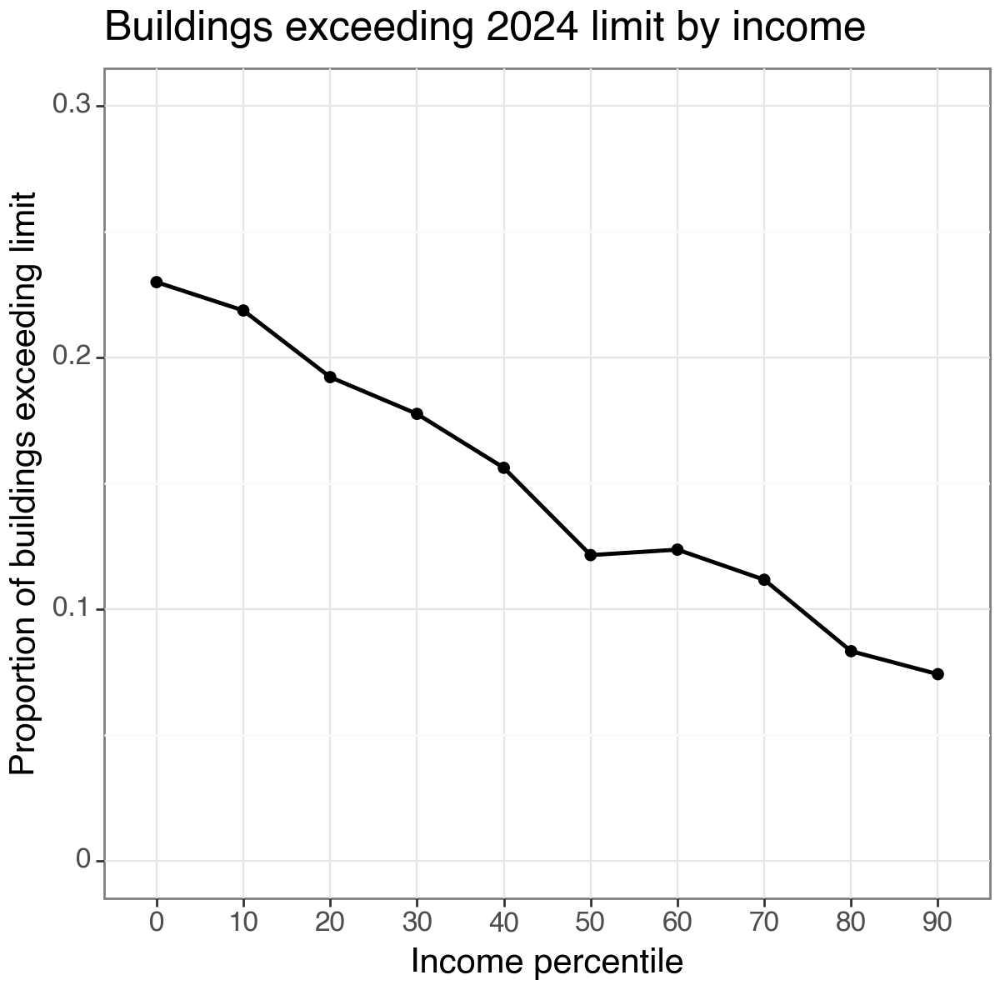

<Figure Size: (600 x 600)>

In [ ]:
(ggplot(plot_dat.query("variable == 'pct_in_excess_2024'"), aes(x = "decile", y = "value", group = "variable")) +
geom_point(size = 2) +
geom_line(size = 1) + 
ylim(0.0, .3) +
theme_bw(base_size=15) +
theme(figure_size=(6,6), legend_position="top") +
labs(x = "Income percentile", y = "Proportion of buildings exceeding limit", title = "Buildings exceeding 2024 limit by income") 
)

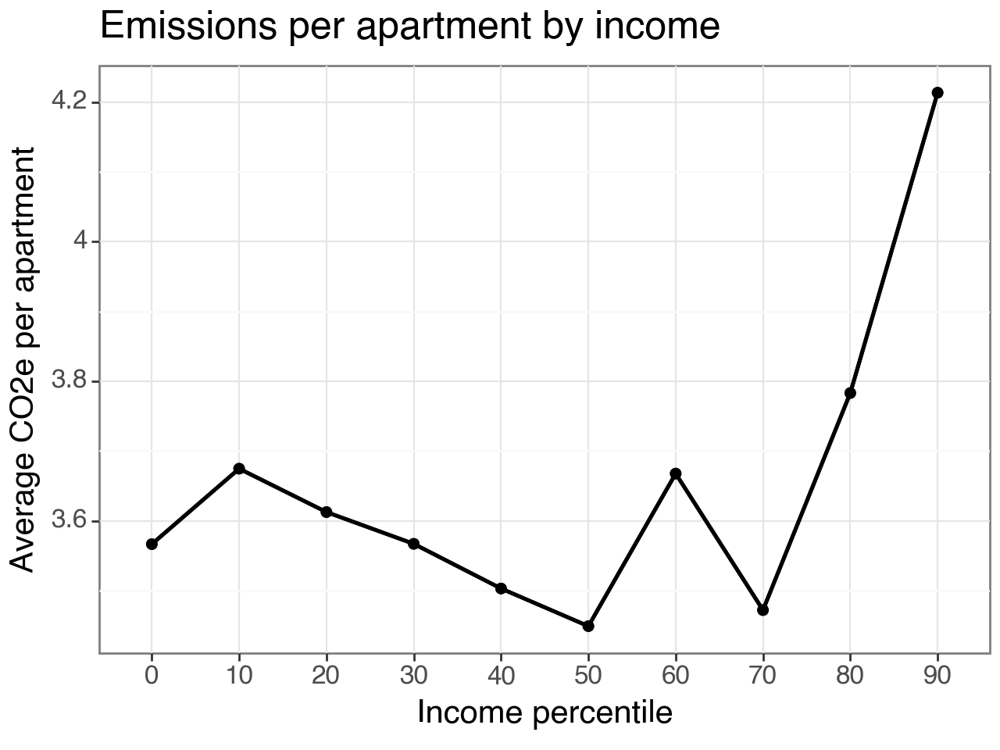

<Figure Size: (640 x 480)>

In [ ]:
(ggplot(plot_dat, aes(x = "decile", y = "avg_co2_bedroom", group = "variable")) +
geom_point(size = 2) +
geom_line(size = 1) + 
theme_bw(base_size = 15) +
labs(x = "Income percentile", y = "Average CO2e per apartment", title = "Emissions per apartment by income"))

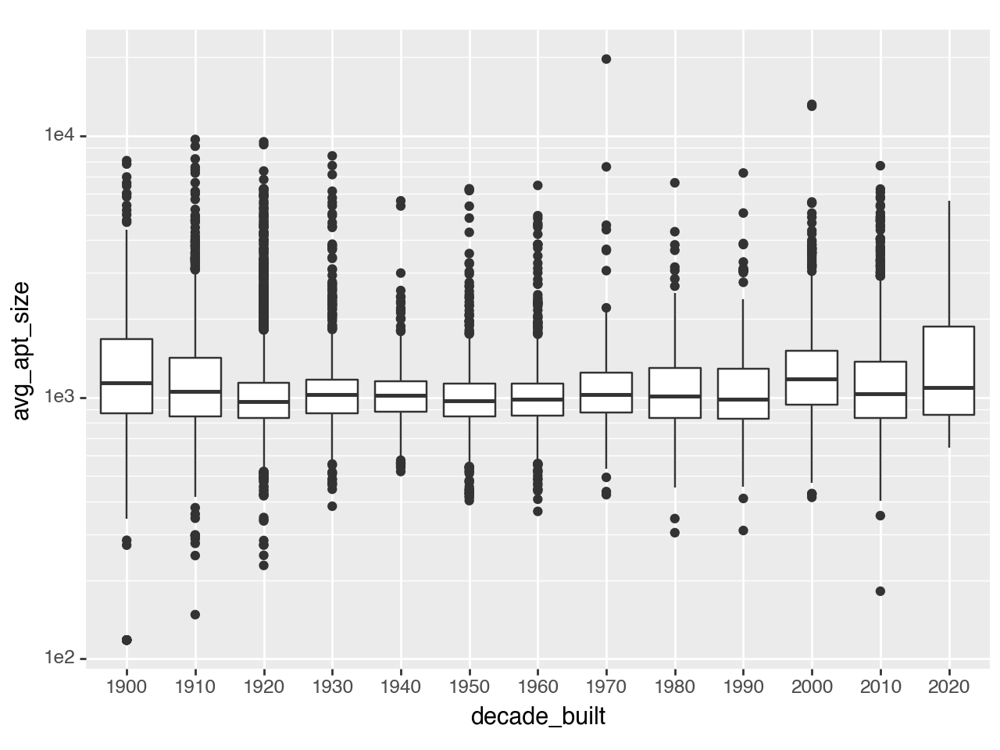

<Figure Size: (640 x 480)>

In [ ]:
housing_trim["decade_built"] = housing_trim["decade_built"].astype(str)
(ggplot(housing_trim.query("year_built >= 1900 & year_built < 2025"), aes(x = "decade_built", y = "avg_apt_size")) +
geom_boxplot() +
scale_y_log10()
)

/Users/canyonfoot/Documents/python_proj/.venv/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Users/canyonfoot/Documents/python_proj/.venv/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 313 rows containing non-finite values.


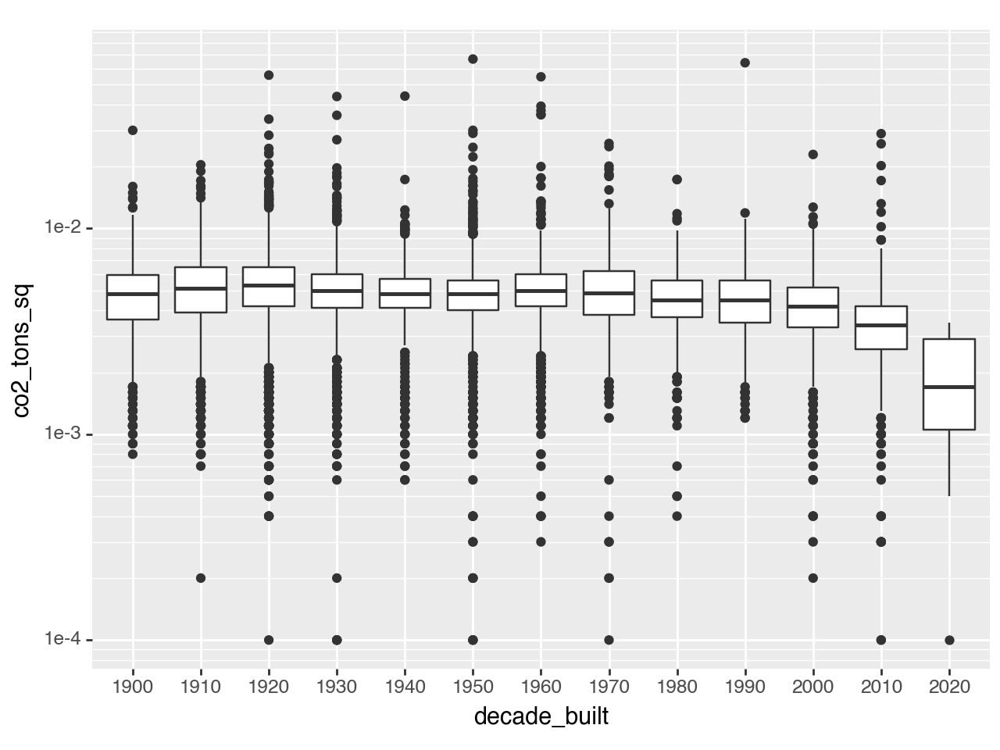

<Figure Size: (640 x 480)>

In [ ]:
housing_trim["decade_built"] = housing_trim["decade_built"].astype(str)
(ggplot(housing_trim.query("year_built >= 1900 & year_built < 2025"), aes(x = "decade_built", y = "co2_tons_sq")) +
geom_boxplot() +
scale_y_log10()
)

In [24]:
housing_trim_geo.columns

NameError: name 'housing_trim_geo' is not defined

/Users/canyonfoot/Documents/python_proj/.venv/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 382 rows containing non-finite values.


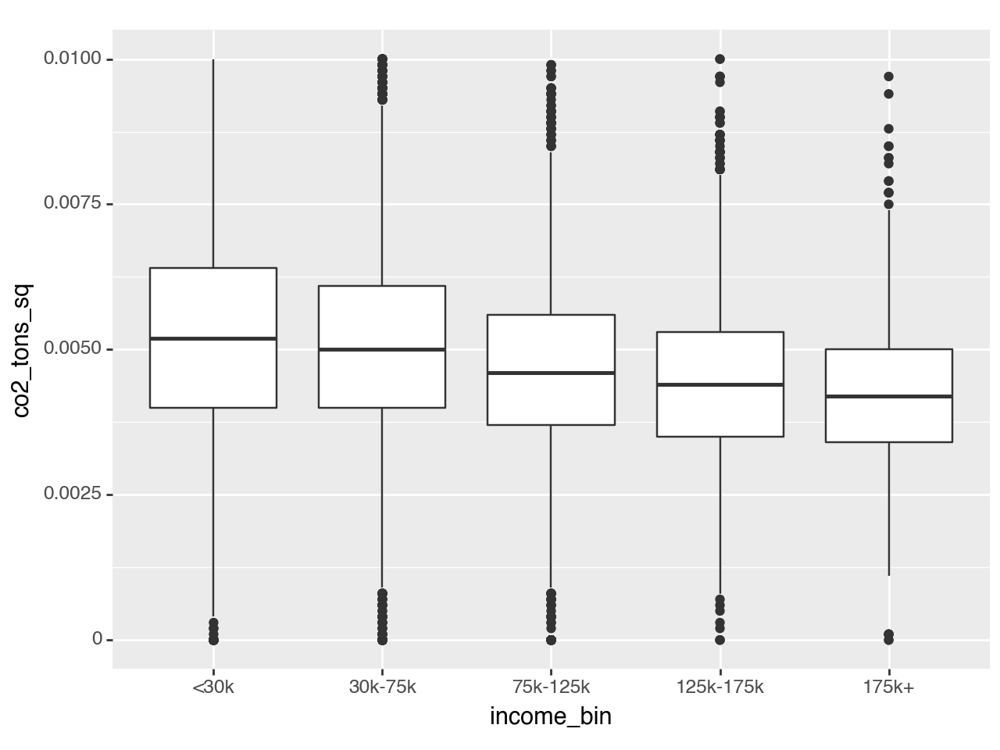

<Figure Size: (640 x 480)>

In [48]:
(ggplot(housing_trim_geo.query("year_built >= 1900 & year_built < 2025"), aes(x = "income_bin", y = "co2_tons_sq")) +
geom_boxplot() + ylim(0, 0.01) )

/Users/canyonfoot/Documents/python_proj/.venv/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 430 rows containing non-finite values.


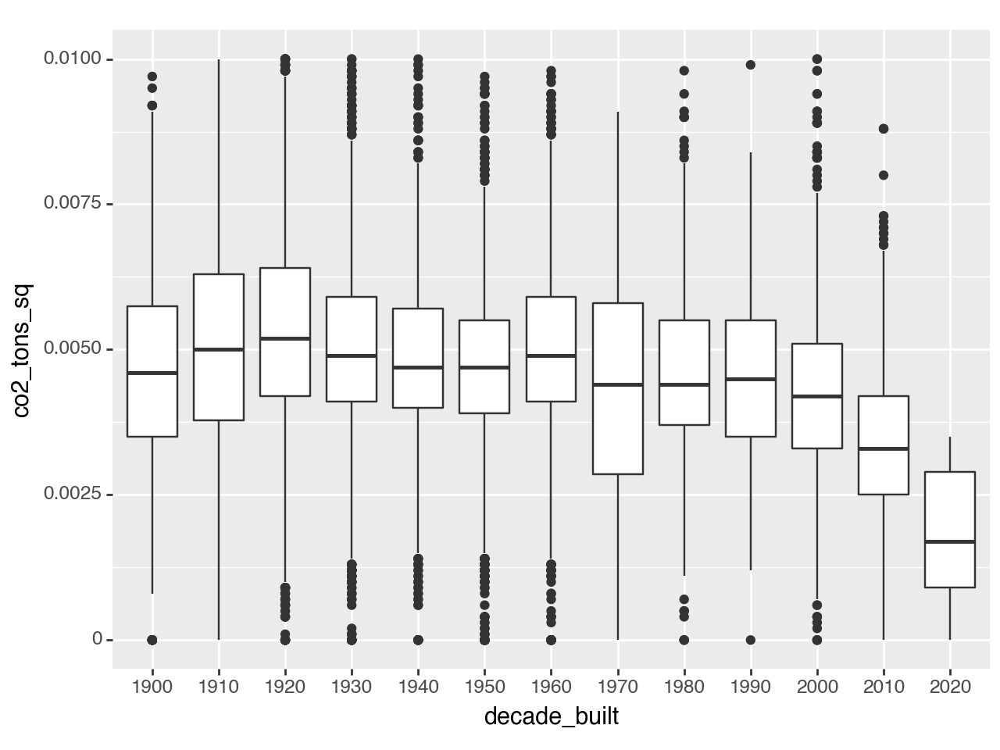

<Figure Size: (640 x 480)>

In [51]:
(ggplot(housing_trim.query("year_built >= 1900 & year_built < 2025"), aes(x = "decade_built", y = "co2_tons_sq")) +
geom_boxplot() + ylim(0, 0.01) )

/Users/canyonfoot/Documents/python_proj/Building-Emissions/.venv/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 89 rows containing missing values.


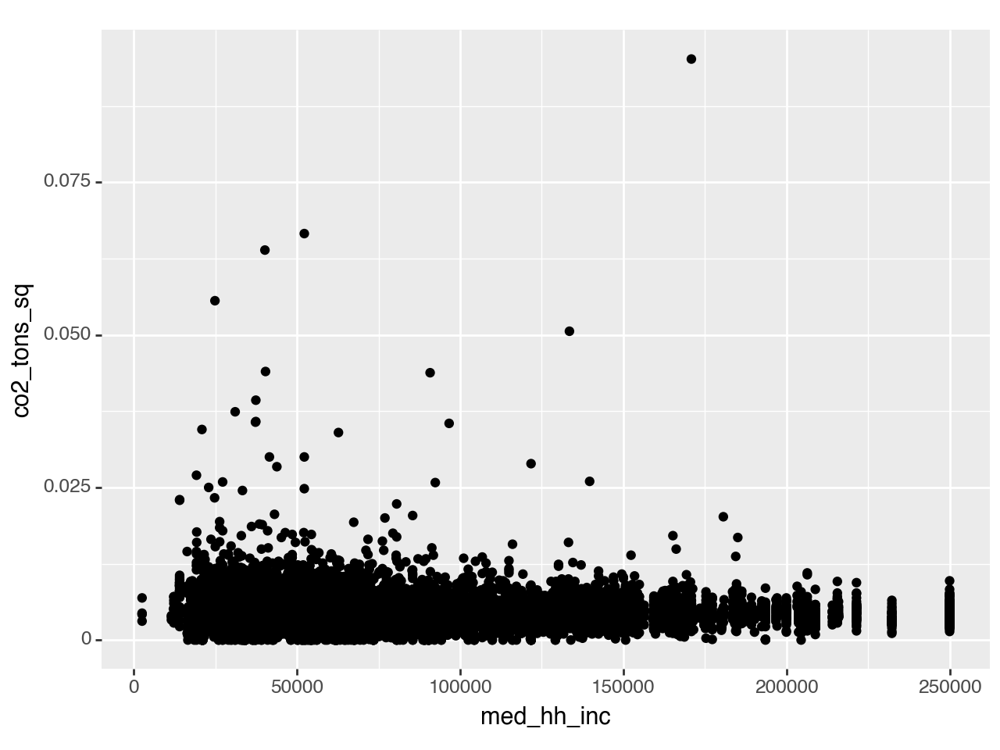

<Figure Size: (640 x 480)>

In [118]:
(ggplot(housing_trim_geo, aes(x = "med_hh_inc", y = "co2_tons_sq")) +
geom_point() 
)

In [119]:
housing_trim_geo['exceeds_2024_limit'] = housing_trim_geo['exceeds_2024_limit'].astype(int)

In [309]:
model = smf.ols("exceeds_2024_limit ~ income_q", data=housing_trim_geo)
result = model.fit()

print(result.summary())

ValueError: endog has evaluated to an array with multiple columns that has shape (13828, 2). This occurs when the variable converted to endog is non-numeric (e.g., bool or str).

In [65]:
housing_trim_geo

,name,Property Id,total_units,EUI,bedrooms,housing_fa,total_fa,co2_intensity,total_co2,NTA,...,apt_size_cat,sqft_bedroom_cat,STATE,COUNTY,TRACT,med_hh_inc,GEOID,geometry,income_bin,income_q
0,30 East 37th Street,2383146,104.0,66.3,110.00,92697.0,92697.0,5.0,460.9,Murray Hill-Kips Bay,...,750 - 1000,750 - 1000,36,061,008200,154681.0,36061008200,POINT (-73.98121 40.74950),125k-175k,9
1,The Elysabeth Condominium,2663925,112.0,71.2,112.00,93180.0,93180.0,4.9,460.3,Murray Hill-Kips Bay,...,750 - 1000,750 - 1000,36,061,008200,154681.0,36061008200,POINT (-73.98040 40.74999),125k-175k,9
2,Stonehenge - 20 Park Avenue,2665901,100.0,87.8,118.00,94442.0,94442.0,6.6,626.2,Murray Hill-Kips Bay,...,750 - 1000,750 - 1000,36,061,008200,154681.0,36061008200,POINT (-73.98079 40.74785),125k-175k,9
3,7 East 35th Street,3530122,58.0,64.3,73.00,64598.0,64598.0,4.0,261.5,Murray Hill-Kips Bay,...,1000 - 1250,750 - 1000,36,061,008200,154681.0,36061008200,POINT (-73.98352 40.74888),125k-175k,9
4,Wavecrest - 1 East 35th Street,4043921,90.0,108.6,108.00,97000.0,97000.0,6.4,618.0,Murray Hill-Kips Bay,...,1000 - 1250,750 - 1000,36,061,008200,154681.0,36061008200,POINT (-73.98383 40.74901),125k-175k,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13934,1792 Lafayette Ave,15966350,44.0,102.4,88.00,29988.0,29988.0,6.2,186.2,Soundview-Castle Hill-Clason Point-Harding Park,...,< 750,< 450,36,005,003800,51442.0,36005003800,POINT (-73.86425 40.82121),30k-75k,3
13935,2559 WEBSTER AVENUE,16643429,42.0,138.4,93.00,45908.0,45908.0,8.0,367.7,Belmont,...,1000 - 1250,450 - 600,36,005,039700,32619.0,36005039700,POINT (-73.89077 40.86215),30k-75k,1
13936,1163 Sutter Ave,16643430,23.0,30.7,46.00,32400.0,32400.0,2.3,72.9,East New York,...,1250 - 2000,600 - 750,36,047,119400,45758.0,36047119400,POINT (-73.87507 40.67234),30k-75k,2
13937,2730 Schurz Avenue,16757786,52.0,20.7,84.35,60253.0,60253.0,1.3,75.5,Schuylerville-Throgs Neck-Edgewater Park,...,1000 - 1250,600 - 750,36,005,013200,125486.0,36005013200,POINT (-73.82165 40.81364),125k-175k,8


In [64]:
model = smf.logit("co2_tons_sq ~ avg_apt_size + year_built + med_hh_inc", data=housing_trim_geo)
result = model.fit()

print(result.summary())

                            OLS Regression Results                            
Dep. Variable:            co2_tons_sq   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.060
Method:                 Least Squares   F-statistic:                     295.4
Date:                Mon, 11 Dec 2023   Prob (F-statistic):          7.41e-186
Time:                        17:13:52   Log-Likelihood:                 63196.
No. Observations:               13742   AIC:                        -1.264e+05
Df Residuals:                   13738   BIC:                        -1.264e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        0.0314      0.001     24.774   

In [60]:
model = smf.ols("co2_per_sq ~ avg_apt_size", data=housing_trim_geo)
result = model.fit()

print(result.summary())

PatsyError: Error evaluating factor: NameError: name 'co2_per_sq' is not defined
    co2_per_sq ~ avg_apt_size
    ^^^^^^^^^^

In [123]:
housing.columns.to_list()

['Property Id',
 'Property Name',
 'Parent Property Id',
 'Parent Property Name',
 'Year Ending',
 'NYC Borough, Block and Lot (BBL)',
 'NYC Building Identification Number (BIN)',
 'Address 1',
 'City',
 'Postcode',
 'Primary Property Type - Self Selected',
 'Primary Property Type - Portfolio Manager-Calculated',
 'National Median Reference Property Type',
 'List of All Property Use Types at Property',
 'Largest Property Use Type',
 'Largest Property Use Type - Gross Floor Area (ft²)',
 '2nd Largest Property Use Type',
 '2nd Largest Property Use - Gross Floor Area (ft²)',
 '3rd Largest Property Use Type',
 '3rd Largest Property Use Type - Gross Floor Area (ft²)',
 'Year Built',
 'Construction Status',
 'Number of Buildings',
 'Occupancy',
 'Metered Areas (Energy)',
 'Metered Areas (Water)',
 'ENERGY STAR Score',
 'National Median ENERGY STAR Score',
 'Target ENERGY STAR Score',
 'Reason(s) for No Score',
 'ENERGY STAR Certification - Year(s) Certified (Score)',
 'ENERGY STAR Certificat

In [124]:
housing["Multifamily Housing - Resident Population Type"]

48                         Not Available
70                         Not Available
1088                       Not Available
1095                       Not Available
1096                       Not Available
                      ...               
28057    No specific resident population
28058                      Not Available
28060    No specific resident population
28061                      Not Available
28065    No specific resident population
Name: Multifamily Housing - Resident Population Type, Length: 17704, dtype: object

In [125]:
 coefs = {'Fuel Oil #2 Use (kBtu)' : 0.00007421,
 'Fuel Oil #4 Use (kBtu)' : 0.00007529,
 'District Steam Use (kBtu)' : 0.00004493,
 'Natural Gas Use (kBtu)' : 0.00005311 ,
 'Electricity Use - Grid Purchase (kWh)' : 0.000288962}

In [126]:
energy_mix = housing[['Property Id'] + list(coefs.keys())].apply(pd.to_numeric, errors='coerce').fillna(0)

In [127]:
for col, coef in coefs.items():
    energy_mix[col + "_est"] = energy_mix[col] * coef

In [128]:
# Create 'total' column
cols = [col + "_est" for col in coefs.keys()]

energy_mix['total_emissions'] = energy_mix[cols].sum(axis=1)

# Create proportion columns
for col in cols:
    energy_mix[f'{col}_proportion'] = energy_mix[col] / energy_mix['total_emissions']

In [129]:
energy_mix["fuel_oil_pct"] = energy_mix["Fuel Oil #2 Use (kBtu)_est_proportion"] + energy_mix["Fuel Oil #4 Use (kBtu)_est_proportion"]
energy_mix["district_steam_pct"] = energy_mix["District Steam Use (kBtu)_est_proportion"]
energy_mix["natural_gas_pct"] = energy_mix["Natural Gas Use (kBtu)_est_proportion"]
energy_mix["electricity_pct"] = energy_mix["Electricity Use - Grid Purchase (kWh)_est_proportion"]

In [130]:
energy_mix_join = energy_mix[["Property Id", "total_emissions", "district_steam_pct", "natural_gas_pct", "electricity_pct"]]
housing_trim = energy_mix_join.merge(housing_trim)

In [131]:
plot_dat = housing_trim.melt(id_vars = ["Property Id", "apt_size_cat"], value_vars = ["district_steam_pct", "natural_gas_pct", "electricity_pct"])
plot_dat

,Property Id,apt_size_cat,variable,value
0,1443214,750 - 1000,district_steam_pct,0.000000
1,2008956,1000 - 1500,district_steam_pct,0.000000
2,2008963,1000 - 1500,district_steam_pct,0.000000
3,2009074,750 - 1000,district_steam_pct,0.000000
4,2383146,750 - 1000,district_steam_pct,0.000000
...,...,...,...,...
50185,16911026,750 - 1000,electricity_pct,0.218644
50186,16951974,1000 - 1500,electricity_pct,0.238338
50187,17248794,750 - 1000,electricity_pct,0.182713
50188,17283996,< 750,electricity_pct,1.000000


/Users/canyonfoot/Documents/python_proj/Building-Emissions/.venv/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 852 rows containing non-finite values.


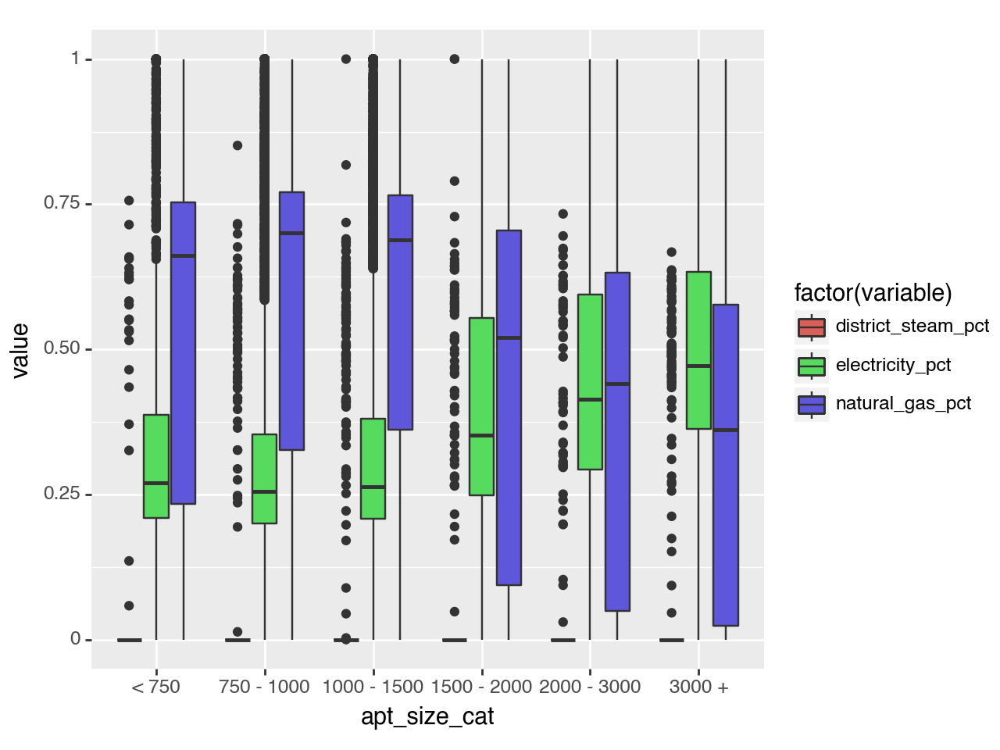

<Figure Size: (640 x 480)>

In [132]:
(
    ggplot(plot_dat, aes(x='apt_size_cat', y='value', fill='factor(variable)'))
    + geom_boxplot()
)

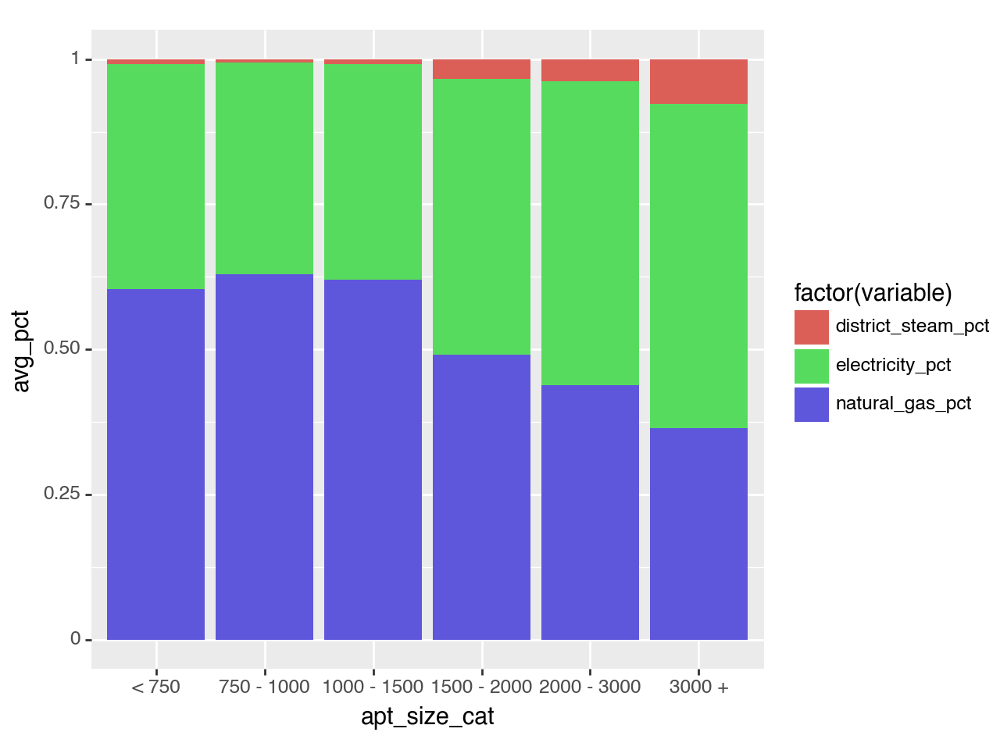

<Figure Size: (640 x 480)>

In [133]:
plot_dat2 = plot_dat.groupby(["apt_size_cat", "variable"]).agg(avg_pct = ("value", "mean")).reset_index()
(
    ggplot(plot_dat2, aes(x='apt_size_cat', y='avg_pct', fill='factor(variable)'))
    + geom_bar(position = "fill", stat = "identity")
)

In [134]:
model = smf.ols("co2_tons_sq ~ avg_apt_size + electricity_pct", data=housing_trim)
result = model.fit()

print(result.summary())

                            OLS Regression Results                            
Dep. Variable:            co2_tons_sq   R-squared:                       0.198
Model:                            OLS   Adj. R-squared:                  0.198
Method:                 Least Squares   F-statistic:                     2023.
Date:                Wed, 02 Aug 2023   Prob (F-statistic):               0.00
Time:                        13:07:49   Log-Likelihood:                 76301.
No. Observations:               16397   AIC:                        -1.526e+05
Df Residuals:                   16394   BIC:                        -1.526e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           0.0072   4.27e-05    1

In [135]:
+housing_trim["exceeds_2024_limit"] = housing_trim["exceeds_2024_limit"].astype(int)
model = smf.logit("exceeds_2024_limit ~ apt_size_cat + electricity_pct + year_built", data=housing_trim)
result = model.fit()

print(result.summary())

Optimization terminated successfully.
         Current function value: 0.367649
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:     exceeds_2024_limit   No. Observations:                16446
Model:                          Logit   Df Residuals:                    16438
Method:                           MLE   Df Model:                            7
Date:                Wed, 02 Aug 2023   Pseudo R-squ.:                  0.1392
Time:                        13:07:50   Log-Likelihood:                -6046.4
converged:                       True   LL-Null:                       -7024.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept                      14.6918      1.907      7.702      0.000   

In [136]:
housing_trim["exceeds_2024_limit"] = housing_trim["exceeds_2024_limit"].astype(int)
model = smf.ols("co2_tons_sq ~ avg_apt_size + electricity_pct + year_built + Occupancy + total_fa", data=housing_trim)
result = model.fit()

print(result.summary())

                            OLS Regression Results                            
Dep. Variable:            co2_tons_sq   R-squared:                       0.198
Model:                            OLS   Adj. R-squared:                  0.198
Method:                 Least Squares   F-statistic:                     811.4
Date:                Wed, 02 Aug 2023   Prob (F-statistic):               0.00
Time:                        13:07:50   Log-Likelihood:                 76305.
No. Observations:               16397   AIC:                        -1.526e+05
Df Residuals:                   16391   BIC:                        -1.526e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           0.0083      0.001     

In [137]:
housing_trim.query("year_built > 1990").groupby("apt_size_cat").agg(
    pct_in_excess_2024=('exceeds_2024_limit', lambda x: np.mean(x)),
    pct_in_excess_2030=('exceeds_2030_limit', lambda x: np.mean(x)),
    n=('exceeds_2024_limit', 'count'),
    avg_co2_apt=('co2_per_apt', 'mean'),
    avg_co2_sqft=('co2_tons_sq', 'mean')
).reset_index()

,apt_size_cat,pct_in_excess_2024,pct_in_excess_2030,n,avg_co2_apt,avg_co2_sqft
0,< 750,0.165138,0.715596,218,3.192341,0.005128
1,750 - 1000,0.073976,0.525760,757,3.885477,0.004343
2,1000 - 1500,0.034091,0.404959,968,4.647824,0.003842
3,1500 - 2000,0.014760,0.321033,271,6.190425,0.003560
4,2000 - 3000,0.032432,0.351351,185,8.908798,0.003663
5,3000 +,0.033333,0.358333,120,15.743012,0.003755


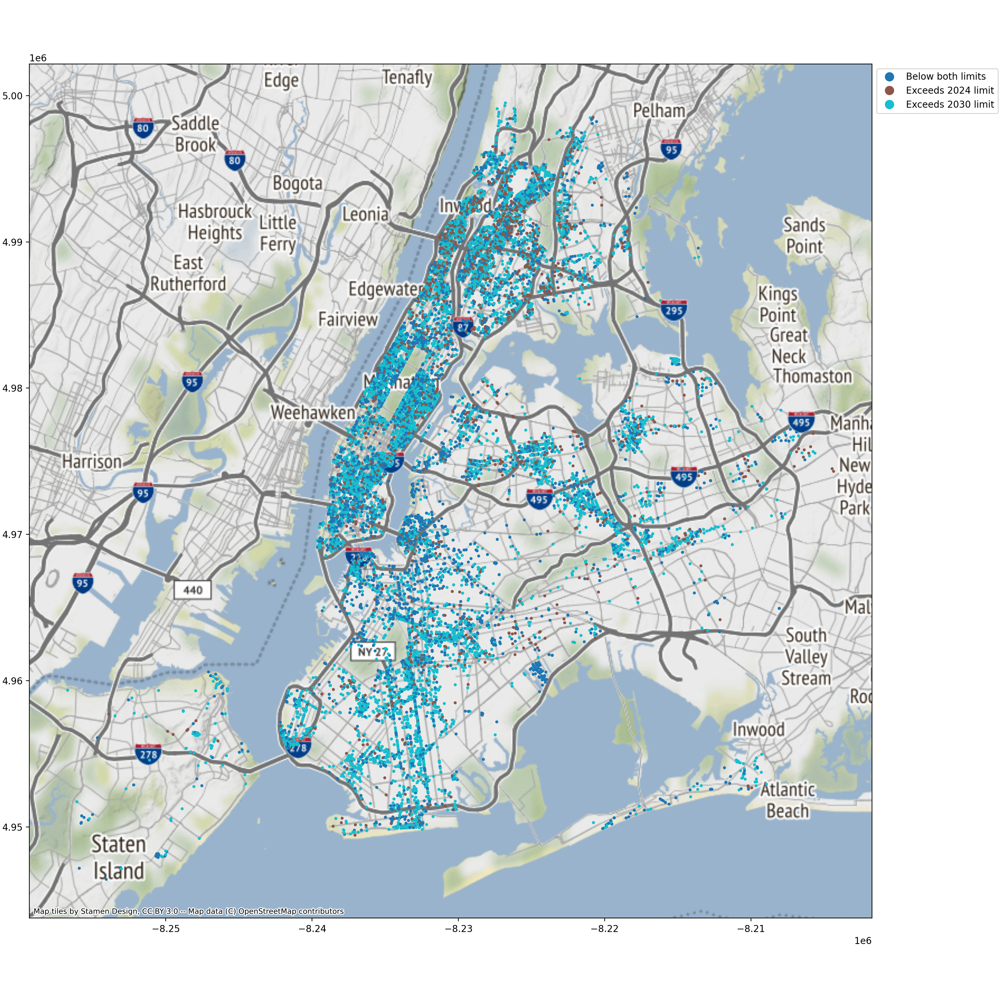

In [138]:
import contextily as ctx
import matplotlib.pyplot as plt

# Make sure the geodataframe is in Web Mercator projection
housing_trim_geo = housing_trim_geo.to_crs(epsg=3857)

# Create a figure and axes
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the geodataframe with small points and add a legend
housing_trim_geo.plot(ax=ax, markersize=5, column = "limit_category", legend=True, 
                      legend_kwds={'loc': 'upper left', 'bbox_to_anchor': (1,1)})

# Add a basemap
ctx.add_basemap(ax)

# Display the plot
plt.tight_layout()
plt.show()


In [139]:
housing.Occupancy

48        95
70       100
1088     100
1095     100
1096     100
        ... 
28057    100
28058    100
28060     90
28061    100
28065    100
Name: Occupancy, Length: 17704, dtype: int64